In [1]:
import pandas as pd

In [2]:
df = pd.read_csv('https://raw.githubusercontent.com/aishwaryamate/Datasets/main/data_clean.csv')

In [3]:
df.head()

,Unnamed: 0,Ozone,Solar.R,Wind,Temp C,Month,Day,Year,Temp,Weather
0,1,41.0,190.0,7.4,67,5,1,2010,67,S
1,2,36.0,118.0,8.0,72,5,2,2010,72,C
2,3,12.0,149.0,12.6,74,5,3,2010,74,PS
3,4,18.0,313.0,11.5,62,5,4,2010,62,S
4,5,NaN,NaN,14.3,56,5,5,2010,56,S


In [4]:
df = pd.read_csv('https://raw.githubusercontent.com/aishwaryamate/Datasets/main/data_clean.csv', index_col=0)
df.head()

,Ozone,Solar.R,Wind,Temp C,Month,Day,Year,Temp,Weather
1,41.0,190.0,7.4,67,5,1,2010,67,S
2,36.0,118.0,8.0,72,5,2,2010,72,C
3,12.0,149.0,12.6,74,5,3,2010,74,PS
4,18.0,313.0,11.5,62,5,4,2010,62,S
5,NaN,NaN,14.3,56,5,5,2010,56,S


In [5]:
# pd.options.display.max_rows = 158
# df

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 158 entries, 1 to 158
Data columns (total 9 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Ozone    120 non-null    float64
 1   Solar.R  151 non-null    float64
 2   Wind     158 non-null    float64
 3   Temp C   158 non-null    object 
 4   Month    158 non-null    object 
 5   Day      158 non-null    int64  
 6   Year     158 non-null    int64  
 7   Temp     158 non-null    int64  
 8   Weather  155 non-null    object 
dtypes: float64(3), int64(3), object(3)
memory usage: 12.3+ KB


In [7]:
df.describe()

,Ozone,Solar.R,Wind,Day,Year,Temp
count,120.000000,151.000000,158.000000,158.000000,158.0,158.000000
mean,41.583333,185.403974,9.957595,16.006329,2010.0,77.727848
std,32.620709,88.723103,3.511261,8.997166,0.0,9.377877
min,1.000000,7.000000,1.700000,1.000000,2010.0,56.000000
25%,18.000000,119.000000,7.400000,8.000000,2010.0,72.000000
50%,30.500000,197.000000,9.700000,16.000000,2010.0,78.500000
75%,61.500000,257.000000,11.875000,24.000000,2010.0,84.000000
max,168.000000,334.000000,20.700000,31.000000,2010.0,97.000000


# Change Data Type

By using the replace function and 
By Python built in function to_numeric

In [8]:
df.dtypes

Ozone      float64
Solar.R    float64
Wind       float64
Temp C      object
Month       object
Day          int64
Year         int64
Temp         int64
Weather     object
dtype: object

In [9]:
#Temp c column is object type but actually its float.
df['Temp C'].unique() # to know the why object dtype show

array(['67', '72', '74', '62', '56', '66', '65', '59', '61', '69', 'C',
       '68', '58', '64', '57', '73', '81', '79', '76', '78', '84', '85',
       '82', '87', '90', '93', '92', '80', '77', '75', '83', '88', '89',
       '91', '86', '97', '94', '96', '71', '63', '70'], dtype=object)

In [10]:
df['Temp C'] = pd.to_numeric(df['Temp C'], errors='coerce',)

In [11]:
df['Temp C'].dtype

dtype('float64')

In [12]:
df['Temp C'].unique()

array([67., 72., 74., 62., 56., 66., 65., 59., 61., 69., nan, 68., 58.,
       64., 57., 73., 81., 79., 76., 78., 84., 85., 82., 87., 90., 93.,
       92., 80., 77., 75., 83., 88., 89., 91., 86., 97., 94., 96., 71.,
       63., 70.])

In [13]:
#now for Month column actually its int but df.info give object

In [14]:
df['Month'].unique()

array(['5', 'May', '6', '7', '8', '9'], dtype=object)

In [15]:
#because the May its show object so it change

In [16]:
df['Month'].replace('May','5',inplace=True)

In [17]:
df['Month'].dtype

dtype('O')

In [18]:
df['Month'] = df['Month'].astype(int)

In [19]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 158 entries, 1 to 158
Data columns (total 9 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Ozone    120 non-null    float64
 1   Solar.R  151 non-null    float64
 2   Wind     158 non-null    float64
 3   Temp C   157 non-null    float64
 4   Month    158 non-null    int32  
 5   Day      158 non-null    int64  
 6   Year     158 non-null    int64  
 7   Temp     158 non-null    int64  
 8   Weather  155 non-null    object 
dtypes: float64(4), int32(1), int64(3), object(1)
memory usage: 11.7+ KB


# Duplicates

In [20]:
df.duplicated()

1      False
2      False
3      False
4      False
5      False
       ...  
154    False
155    False
156    False
157     True
158    False
Length: 158, dtype: bool

In [21]:
df[df.duplicated()]

,Ozone,Solar.R,Wind,Temp C,Month,Day,Year,Temp,Weather
157,14.0,191.0,14.3,75.0,9,28,2010,75,S


In [22]:
#get all duplicates value
#2 approaches

In [23]:
#1st way
df[(df['Ozone']==14.0) & (df['Wind']==14.3)]

,Ozone,Solar.R,Wind,Temp C,Month,Day,Year,Temp,Weather
151,14.0,191.0,14.3,75.0,9,28,2010,75,S
157,14.0,191.0,14.3,75.0,9,28,2010,75,S


In [24]:
#2nd Way
df[df.duplicated(keep=False)]

,Ozone,Solar.R,Wind,Temp C,Month,Day,Year,Temp,Weather
151,14.0,191.0,14.3,75.0,9,28,2010,75,S
157,14.0,191.0,14.3,75.0,9,28,2010,75,S


In [25]:
df.drop_duplicates(inplace=True)

In [26]:
df

,Ozone,Solar.R,Wind,Temp C,Month,Day,Year,Temp,Weather
1,41.0,190.0,7.4,67.0,5,1,2010,67,S
2,36.0,118.0,8.0,72.0,5,2,2010,72,C
3,12.0,149.0,12.6,74.0,5,3,2010,74,PS
4,18.0,313.0,11.5,62.0,5,4,2010,62,S
5,NaN,NaN,14.3,56.0,5,5,2010,56,S
...,...,...,...,...,...,...,...,...,...
153,20.0,223.0,11.5,68.0,9,30,2010,68,S
154,41.0,190.0,7.4,67.0,5,1,2010,67,C
155,30.0,193.0,6.9,70.0,9,26,2010,70,PS
156,NaN,145.0,13.2,77.0,9,27,2010,77,S


In [27]:
df.duplicated().sum()

0

# Drop Columns

In [28]:
#Temp c is double columns

In [29]:
df.drop(columns='Temp C',inplace=True)

In [30]:
df

,Ozone,Solar.R,Wind,Month,Day,Year,Temp,Weather
1,41.0,190.0,7.4,5,1,2010,67,S
2,36.0,118.0,8.0,5,2,2010,72,C
3,12.0,149.0,12.6,5,3,2010,74,PS
4,18.0,313.0,11.5,5,4,2010,62,S
5,NaN,NaN,14.3,5,5,2010,56,S
...,...,...,...,...,...,...,...,...
153,20.0,223.0,11.5,9,30,2010,68,S
154,41.0,190.0,7.4,5,1,2010,67,C
155,30.0,193.0,6.9,9,26,2010,70,PS
156,NaN,145.0,13.2,9,27,2010,77,S


# Rename the colums

In [31]:
df.rename(columns ={'Solar.R': 'Solar','Temp':'Temperature'},inplace=True)

In [32]:
df

,Ozone,Solar,Wind,Month,Day,Year,Temperature,Weather
1,41.0,190.0,7.4,5,1,2010,67,S
2,36.0,118.0,8.0,5,2,2010,72,C
3,12.0,149.0,12.6,5,3,2010,74,PS
4,18.0,313.0,11.5,5,4,2010,62,S
5,NaN,NaN,14.3,5,5,2010,56,S
...,...,...,...,...,...,...,...,...
153,20.0,223.0,11.5,9,30,2010,68,S
154,41.0,190.0,7.4,5,1,2010,67,C
155,30.0,193.0,6.9,9,26,2010,70,PS
156,NaN,145.0,13.2,9,27,2010,77,S


# Missing Value Imputation

In [33]:
#checking Null Value

In [34]:
df.isna().sum()

Ozone          38
Solar           7
Wind            0
Month           0
Day             0
Year            0
Temperature     0
Weather         3
dtype: int64

In [35]:
#visualize null values

In [36]:
import seaborn as sns

In [37]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams['figure.figsize'] = (10,5)
plt.rcParams['figure.dpi'] = 250

<AxesSubplot:>

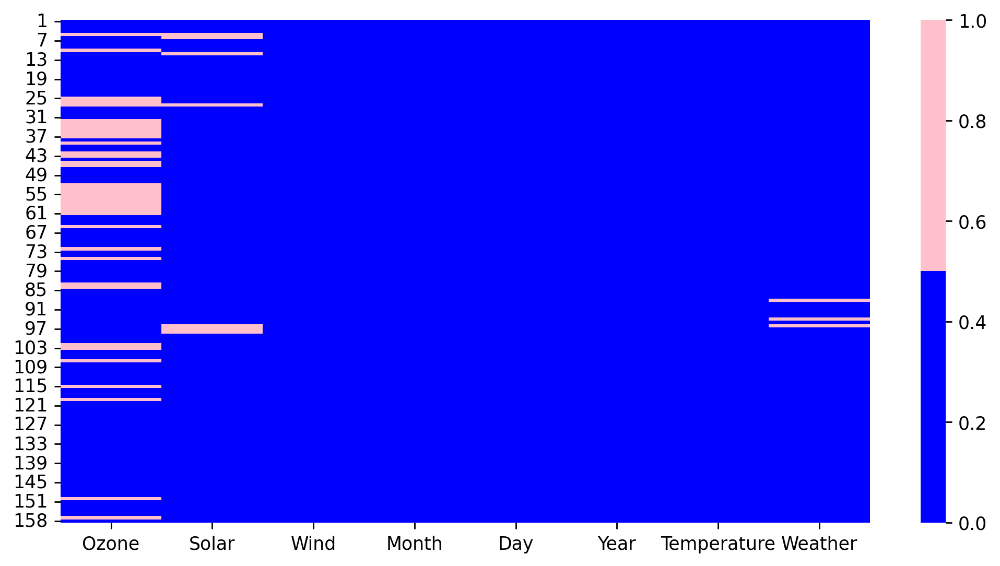

In [38]:
sns.heatmap(df.isna(),cmap=['blue','pink'])

In [39]:
# the null values are less than 3% use dropna()
# if the null values are between 5 to 40% use fillna()
#if the null values are greater than 50% drop the entire column

In [40]:
#calculate the percentage of missing values in each column

In [41]:
len(df[df['Ozone'].isna()])

38

In [42]:
percentage = (len(df[df['Ozone'].isna()])/len(df))*100

In [43]:
percentage

24.203821656050955

In [44]:
median_ozone = df['Ozone'].median()

In [45]:
median_ozone

31.0

In [46]:
df['Ozone'].fillna(median_ozone,inplace=True)

In [47]:
df['Ozone'].isna().sum()

0

In [48]:
(df['Weather'].mode())

0    S
Name: Weather, dtype: object

In [49]:
df['Weather'].fillna(df['Weather'].mode()[0],inplace=True)

In [50]:
df['Weather'].isna().sum()

0

In [51]:
df['Solar'].fillna(df['Solar'].median(),inplace=True)

In [52]:
df['Solar'].isna().sum()

0

In [53]:
df.isna().sum()

Ozone          0
Solar          0
Wind           0
Month          0
Day            0
Year           0
Temperature    0
Weather        0
dtype: int64

# Outliers Detections

1) Histogram
2)Boxplot
3)Descriptive stats for df

In [54]:
import matplotlib.pyplot as plt

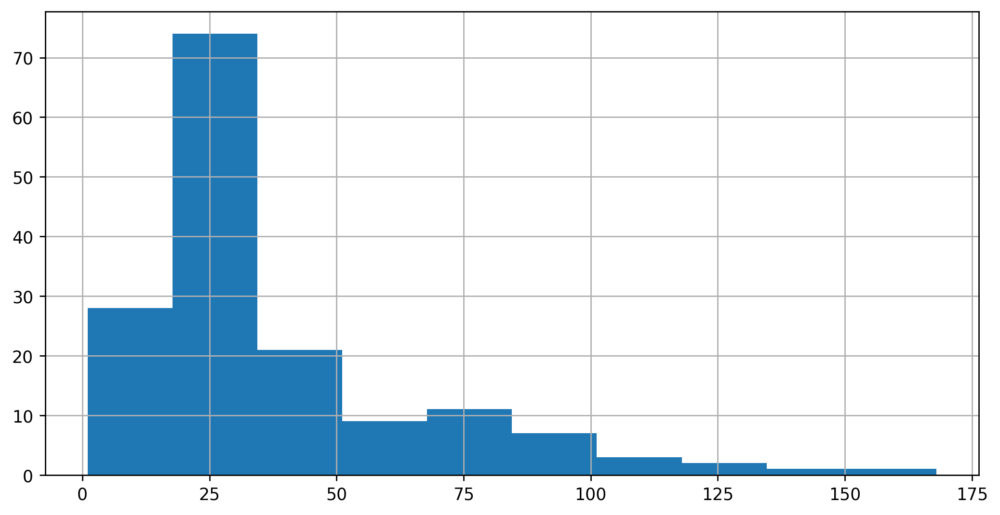

In [55]:
plt.hist(df['Ozone'])
plt.grid()

<AxesSubplot:xlabel='Ozone', ylabel='Density'>

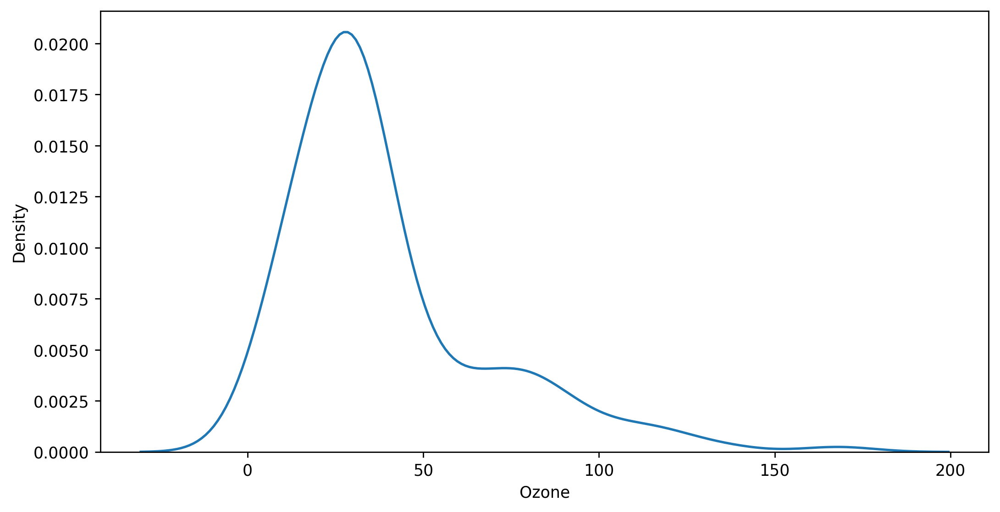

In [56]:
sns.kdeplot(df['Ozone'])

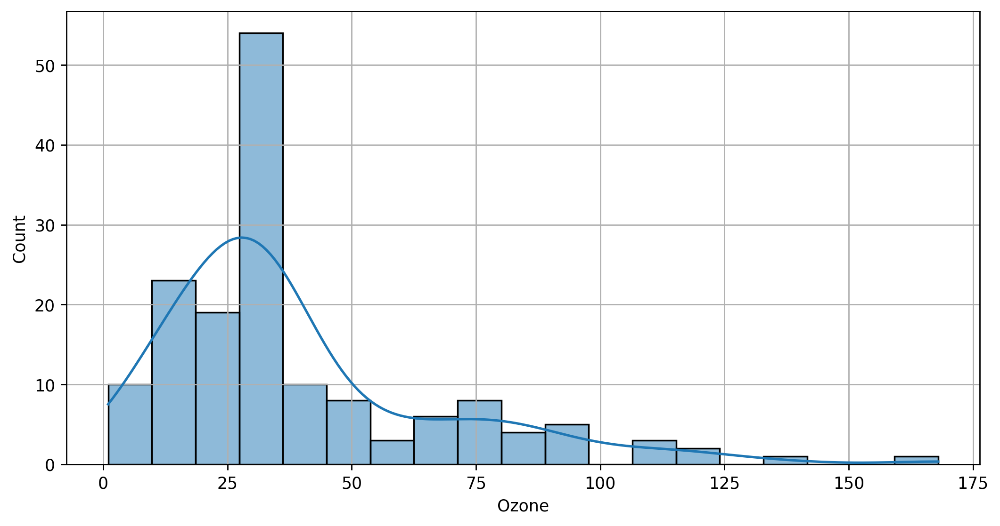

In [57]:
sns.histplot(df['Ozone'],kde=True)
plt.grid()

{'whiskers': [<matplotlib.lines.Line2D at 0x2bb36803610>,
 'caps': [<matplotlib.lines.Line2D at 0x2bb36803be0>,
 'boxes': [<matplotlib.lines.Line2D at 0x2bb36803340>],
 'medians': [<matplotlib.lines.Line2D at 0x2bb368151c0>],
 'fliers': [<matplotlib.lines.Line2D at 0x2bb36815760>],
 'means': [<matplotlib.lines.Line2D at 0x2bb36815490>]}

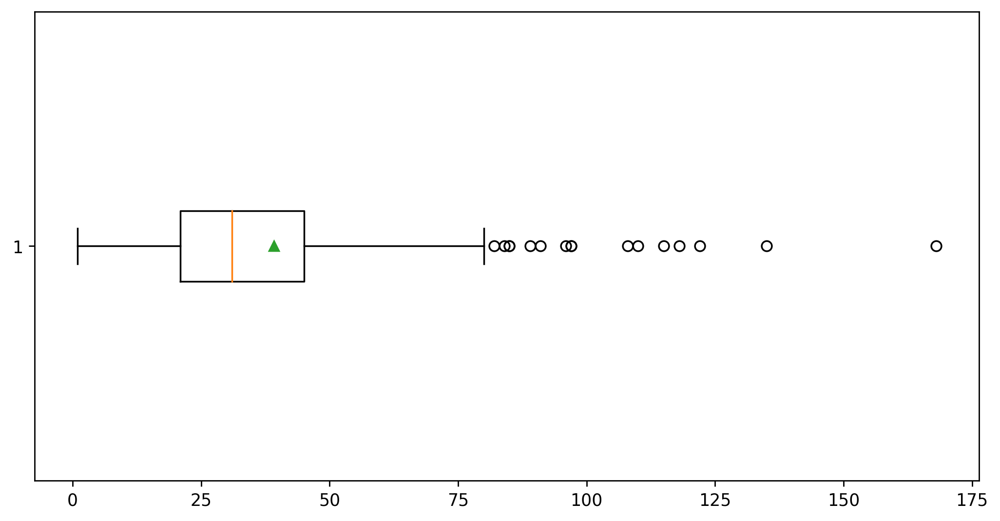

In [58]:
plt.boxplot(df['Ozone'],vert = False,showmeans=True)

# Scatter Plot / Correlation

In [59]:
df.head()

,Ozone,Solar,Wind,Month,Day,Year,Temperature,Weather
1,41.0,190.0,7.4,5,1,2010,67,S
2,36.0,118.0,8.0,5,2,2010,72,C
3,12.0,149.0,12.6,5,3,2010,74,PS
4,18.0,313.0,11.5,5,4,2010,62,S
5,31.0,199.0,14.3,5,5,2010,56,S


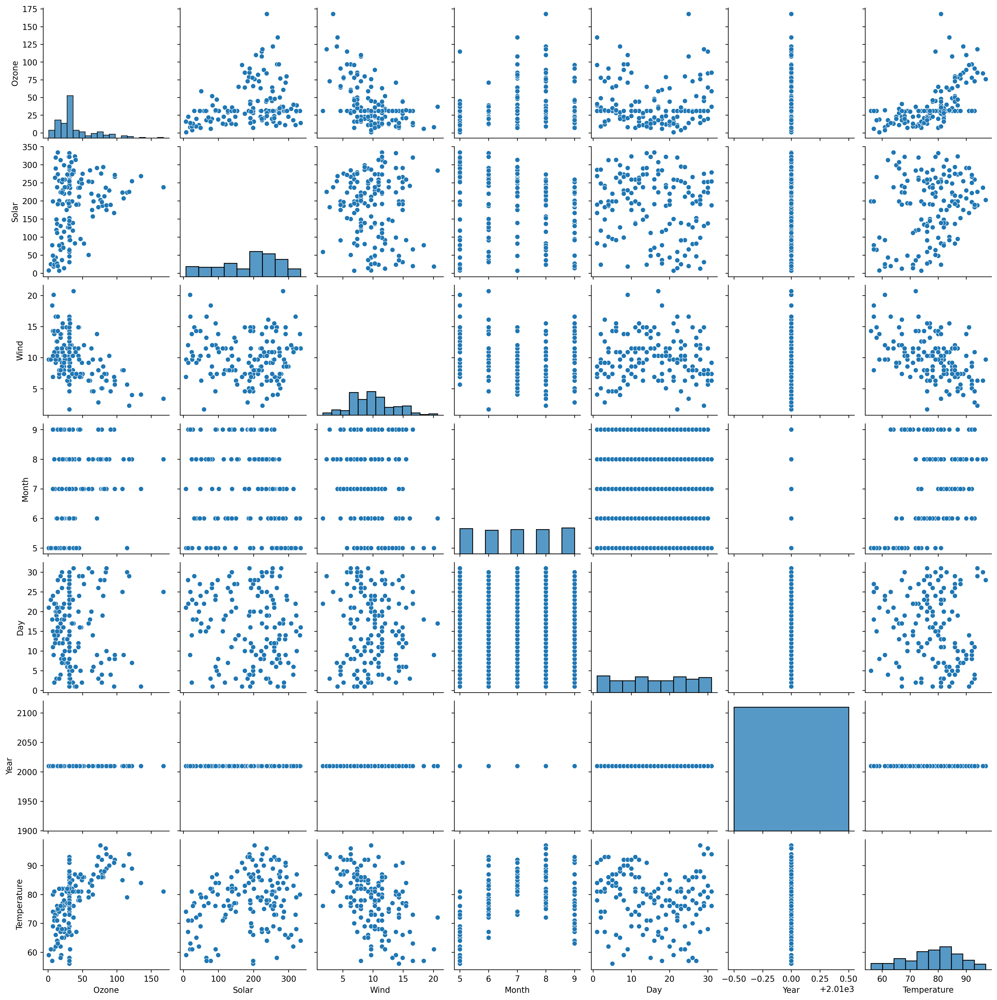

In [60]:
sns.pairplot(data=df)

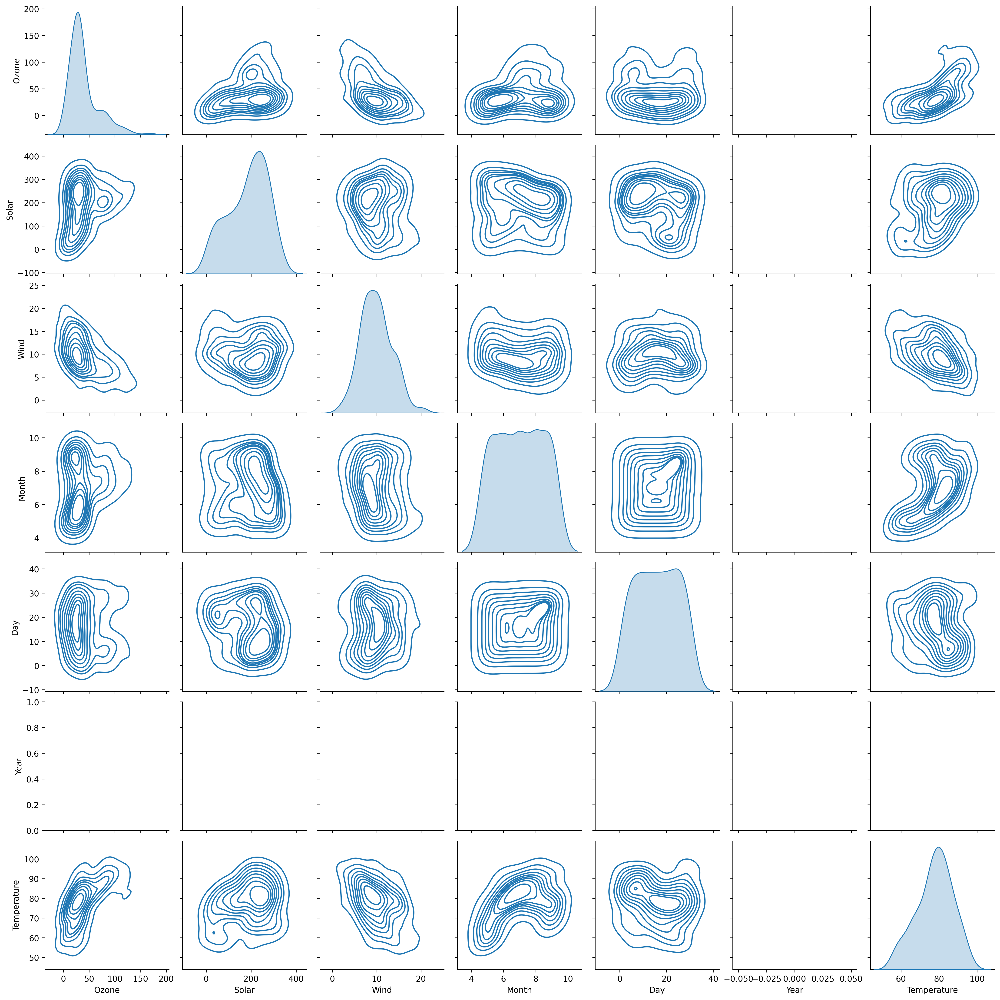

In [61]:
sns.pairplot(data = df,kind='kde')

<AxesSubplot:>

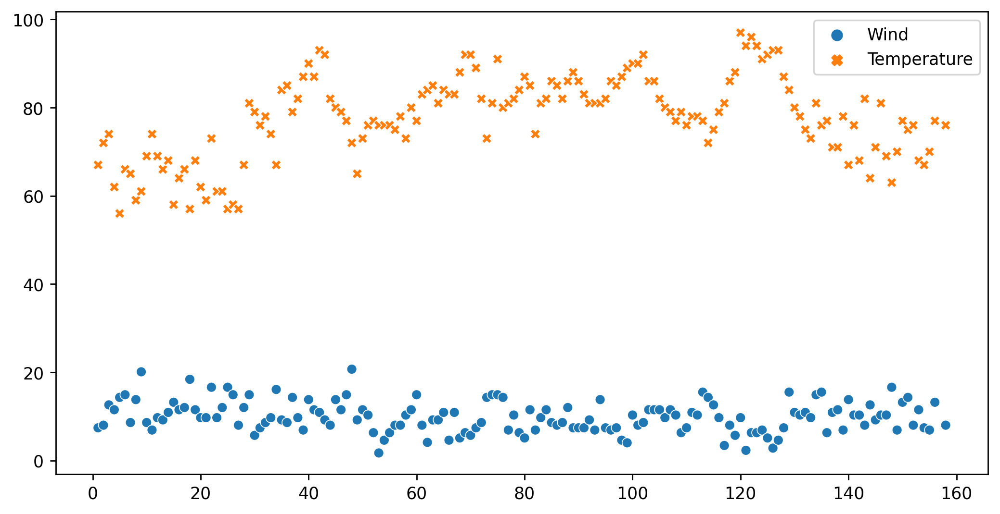

In [70]:
sns.scatterplot(data = (df['Wind'],df['Temperature']))

C:\ProgramData\Anaconda3\lib\site-packages\pandas\plotting\_matplotlib\misc.py:100: UserWarning: Attempting to set identical left == right == 2010.0 results in singular transformations; automatically expanding.
  ax.set_xlim(boundaries_list[j])
C:\ProgramData\Anaconda3\lib\site-packages\pandas\plotting\_matplotlib\misc.py:101: UserWarning: Attempting to set identical bottom == top == 2010.0 results in singular transformations; automatically expanding.
  ax.set_ylim(boundaries_list[i])
C:\ProgramData\Anaconda3\lib\site-packages\pandas\plotting\_matplotlib\misc.py:91: UserWarning: Attempting to set identical left == right == 2010.0 results in singular transformations; automatically expanding.
  ax.set_xlim(boundaries_list[i])


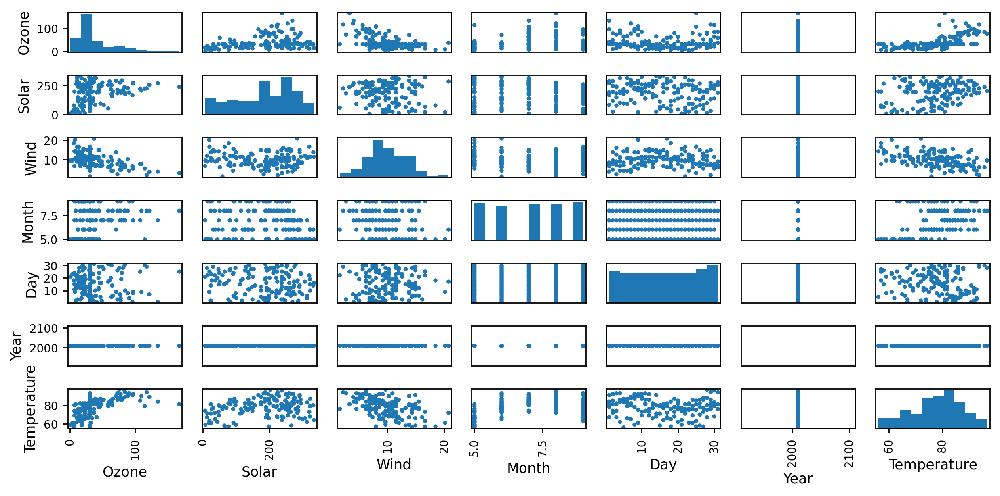

In [74]:
pd.plotting.scatter_matrix(df,alpha=1)
plt.tight_layout()

In [71]:
#Correlation

In [72]:
df.corr()

,Ozone,Solar,Wind,Month,Day,Year,Temperature
Ozone,1.000000,0.297561,-0.523738,0.171488,-0.031737,NaN,0.597087
Solar,0.297561,1.000000,-0.057709,-0.083788,-0.156243,NaN,0.256994
Wind,-0.523738,-0.057709,1.000000,-0.170328,0.029900,NaN,-0.441228
Month,0.171488,-0.083788,-0.170328,1.000000,0.041438,NaN,0.408060
Day,-0.031737,-0.156243,0.029900,0.041438,1.000000,NaN,-0.122787
Year,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Temperature,0.597087,0.256994,-0.441228,0.408060,-0.122787,NaN,1.000000


In [75]:
import plotly.express as pe

In [77]:
pe.scatter(df['Ozone'],df['Wind'])

In [81]:
pe.scatter_3d(x=df['Ozone'],y=df['Wind'],z=df['Temperature'],data_frame=df,color='Weather')

# Transformations

In [83]:
#Encoding using pandas dummy variables

In [84]:
df = pd.get_dummies(data = df,columns=['Weather'])

In [85]:
df

,Ozone,Solar,Wind,Month,Day,Year,Temperature,Weather_C,Weather_PS,Weather_S
1,41.0,190.0,7.4,5,1,2010,67,0,0,1
2,36.0,118.0,8.0,5,2,2010,72,1,0,0
3,12.0,149.0,12.6,5,3,2010,74,0,1,0
4,18.0,313.0,11.5,5,4,2010,62,0,0,1
5,31.0,199.0,14.3,5,5,2010,56,0,0,1
...,...,...,...,...,...,...,...,...,...,...
153,20.0,223.0,11.5,9,30,2010,68,0,0,1
154,41.0,190.0,7.4,5,1,2010,67,1,0,0
155,30.0,193.0,6.9,9,26,2010,70,0,1,0
156,31.0,145.0,13.2,9,27,2010,77,0,0,1


# Scaling The Data

In [86]:
from sklearn.preprocessing import StandardScaler

In [89]:
sc = StandardScaler()

In [90]:
sc.fit_transform(df)

array([[ 0.06282803,  0.04639404, -0.72407878, ..., -0.67357531,
        -0.65366102,  1.2545001 ],
       [-0.11144761, -0.78341331, -0.55235617, ...,  1.48461498,
        -0.65366102, -0.79713027],
       [-0.94797067, -0.42613514,  0.76418385, ..., -0.67357531,
         1.52984494, -0.79713027],
       ...,
       [-0.32057837,  0.08096935, -0.86718096, ..., -0.67357531,
         1.52984494, -0.79713027],
       [-0.28572324, -0.47223555,  0.93590646, ..., -0.67357531,
        -0.65366102,  1.2545001 ],
       [-0.7388399 , -0.63358698, -0.55235617, ...,  1.48461498,
        -0.65366102, -0.79713027]])

In [91]:
scaled_df = pd.DataFrame(sc.fit_transform(df),columns=df.columns)

In [92]:
scaled_df

,Ozone,Solar,Wind,Month,Day,Year,Temperature,Weather_C,Weather_PS,Weather_S
0,0.062828,0.046394,-0.724079,-1.412198,-1.668937,0.0,-1.146116,-0.673575,-0.653661,1.25450
1,-0.111448,-0.783413,-0.552356,-1.412198,-1.557152,0.0,-0.612802,1.484615,-0.653661,-0.79713
2,-0.947971,-0.426135,0.764184,-1.412198,-1.445367,0.0,-0.399476,-0.673575,1.529845,-0.79713
3,-0.738840,1.463982,0.449359,-1.412198,-1.333583,0.0,-1.679431,-0.673575,-0.653661,1.25450
4,-0.285723,0.150120,1.250731,-1.412198,-1.221798,0.0,-2.319408,-0.673575,-0.653661,1.25450
...,...,...,...,...,...,...,...,...,...,...
152,-0.669130,0.426722,0.449359,1.385469,1.572816,0.0,-1.039454,-0.673575,-0.653661,1.25450
153,0.062828,0.046394,-0.724079,-1.412198,-1.668937,0.0,-1.146116,1.484615,-0.653661,-0.79713
154,-0.320578,0.080969,-0.867181,1.385469,1.125678,0.0,-0.826128,-0.673575,1.529845,-0.79713
155,-0.285723,-0.472236,0.935906,1.385469,1.237462,0.0,-0.079488,-0.673575,-0.653661,1.25450


In [97]:
df.head()

,Ozone,Solar,Wind,Month,Day,Year,Temperature,Weather_C,Weather_PS,Weather_S
1,41.0,190.0,7.4,5,1,2010,67,0,0,1
2,36.0,118.0,8.0,5,2,2010,72,1,0,0
3,12.0,149.0,12.6,5,3,2010,74,0,1,0
4,18.0,313.0,11.5,5,4,2010,62,0,0,1
5,31.0,199.0,14.3,5,5,2010,56,0,0,1


In [93]:
scaled_df['Ozone'].mean()

-1.4142968466562504e-17

In [94]:
scaled_df['Ozone'].std()

1.0032000081789556

In [98]:
from sklearn.preprocessing import MinMaxScaler

In [99]:
mn = MinMaxScaler()

In [100]:
min_max_scaler_df = pd.DataFrame(mn.fit_transform(df),columns=df.columns)

In [101]:
min_max_scaler_df

,Ozone,Solar,Wind,Month,Day,Year,Temperature,Weather_C,Weather_PS,Weather_S
0,0.239521,0.559633,0.300000,0.0,0.000000,0.0,0.268293,0.0,0.0,1.0
1,0.209581,0.339450,0.331579,0.0,0.033333,0.0,0.390244,1.0,0.0,0.0
2,0.065868,0.434251,0.573684,0.0,0.066667,0.0,0.439024,0.0,1.0,0.0
3,0.101796,0.935780,0.515789,0.0,0.100000,0.0,0.146341,0.0,0.0,1.0
4,0.179641,0.587156,0.663158,0.0,0.133333,0.0,0.000000,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...
152,0.113772,0.660550,0.515789,1.0,0.966667,0.0,0.292683,0.0,0.0,1.0
153,0.239521,0.559633,0.300000,0.0,0.000000,0.0,0.268293,1.0,0.0,0.0
154,0.173653,0.568807,0.273684,1.0,0.833333,0.0,0.341463,0.0,1.0,0.0
155,0.179641,0.422018,0.605263,1.0,0.866667,0.0,0.512195,0.0,0.0,1.0


In [102]:
min_max_scaler_df['Ozone'].max()

1.0000000000000002

In [103]:
min_max_scaler_df['Ozone'].min()

0.0

# Speed up the EDA process

In [114]:
# !pip install pandas-profiling
# # !pip install sweetviz

In [112]:
import pandas_profiling as pp
import sweetviz as sv

In [116]:
EDA_report = pp.ProfileReport(df,title= 'Pandas Profiling Report',vars={"num":{"low_categorical_threshold":0}})

In [117]:
EDA_report

Summarize dataset:   0%|          | 0/24 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]